# Data visualization

SarcAsM provides various high-level functions in the class `Plots`, see [API reference](../autoapi/sarcasm/plots/index.html#sarcasm.plots.Plots), for publication-grade visualizations using [matplotlib](https://matplotlib.org/). The class `PlotUtils` provides useful utility functions to polish figures.

These functions are modular and designed to work with `matplotlib.axis` instances, allowing you to integrate them seamlessly into complex figure designs. Below are three examples:

## Example: visualization of structure analysis

In [1]:
from sarcasm import SarcAsM

# open previously analyzed TIF-file
filename = '../../_test_data/20211115_ACTN2_CMs_96well_control_12days.tif'
sarc_obj = SarcAsM(filename)

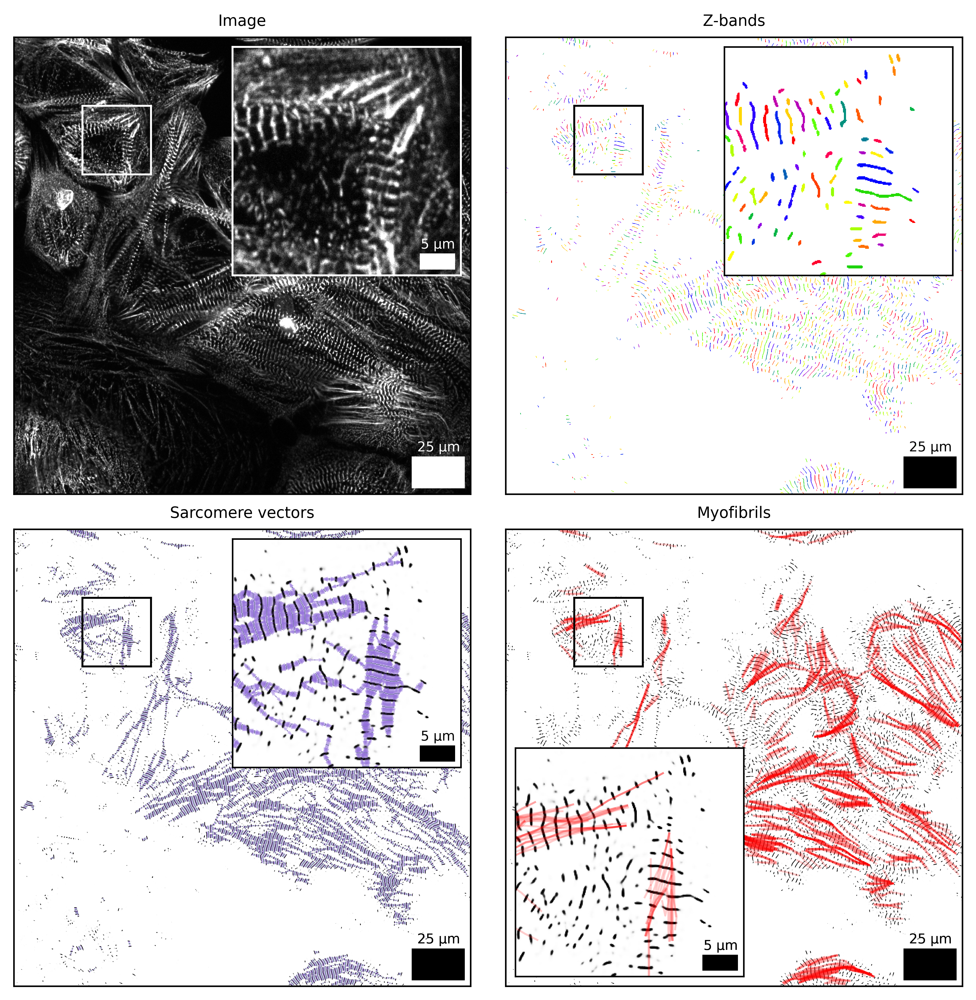

In [2]:
from sarcasm import PlotUtils, Plots
import matplotlib.pyplot as plt

# create multi-panel figure 
mosaic = """
ab
cd
"""

fig, axs = plt.subplot_mosaic(mosaic=mosaic, figsize=(PlotUtils.width_2cols, PlotUtils.width_2cols), constrained_layout=True, dpi=600)

# select frame
frame = 30

# specify zoom inset
zoom_region = [300, 600, 300, 600]
inset_width, inset_height = '50%', '50%'

# image
Plots.plot_image(axs['a'], sarc_obj, frame=frame, title='Image', zoom_region=zoom_region, inset_width=inset_width, inset_height=inset_height)

# Z-band segmentation
Plots.plot_z_segmentation(axs['b'], sarc_obj, frame=frame, title='Z-bands', zoom_region=zoom_region, inset_width=inset_width, inset_height=inset_height)

# sarcomere vectors
Plots.plot_sarcomere_vectors(axs['c'], sarc_obj, frame=frame, title='Sarcomere vectors', zoom_region=zoom_region, inset_width=inset_width, inset_height=inset_height)

# myofibrils
Plots.plot_myofibrils(axs['d'], sarc_obj, frame=frame, title='Myofibrils', zoom_region=zoom_region, inset_width=inset_width, inset_height=inset_height)

# fig.savefig('tutorial_data_visualization.png')

## Example: boxplots of structure features

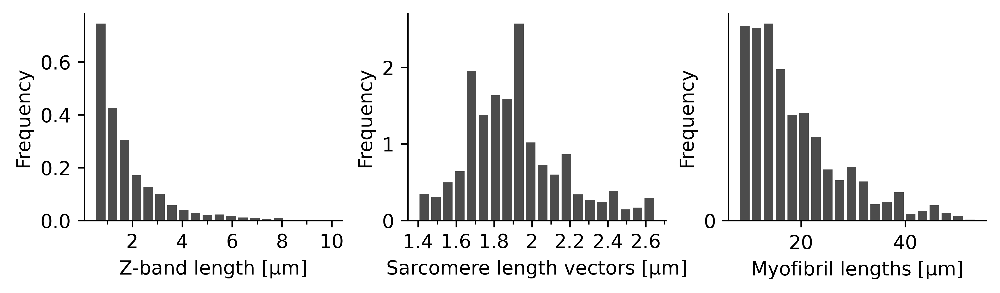

In [10]:
from sarcasm import PlotUtils, Plots
import matplotlib.pyplot as plt

# create multi-panel figure 
mosaic = """
abc
"""

fig, axs = plt.subplot_mosaic(mosaic=mosaic, figsize=(PlotUtils.width_2cols, 2), constrained_layout=True, dpi=600)

# select frame
frame = 30

# z-band length
Plots.plot_histogram_structure(axs['a'], sarc_obj, feature='z_length', frame=frame, range=(0.5, 10))
PlotUtils.polish_xticks(axs['a'], 2, 1)

# sarcomere length
Plots.plot_histogram_structure(axs['b'], sarc_obj, feature='sarcomere_length_vectors', frame=frame)
PlotUtils.polish_xticks(axs['b'], 0.2, 0.1)

# myofibril length
Plots.plot_histogram_structure(axs['c'], sarc_obj, feature='myof_length', frame=frame)
PlotUtils.polish_yticks(axs['c'], 10, 5)

# fig.savefig('tutorial_histograms.png')

## Example: visualization of LOI motion analysis

This multi-panel figure is also included in our package, see `Plots.plot_loi_summary_motion`.


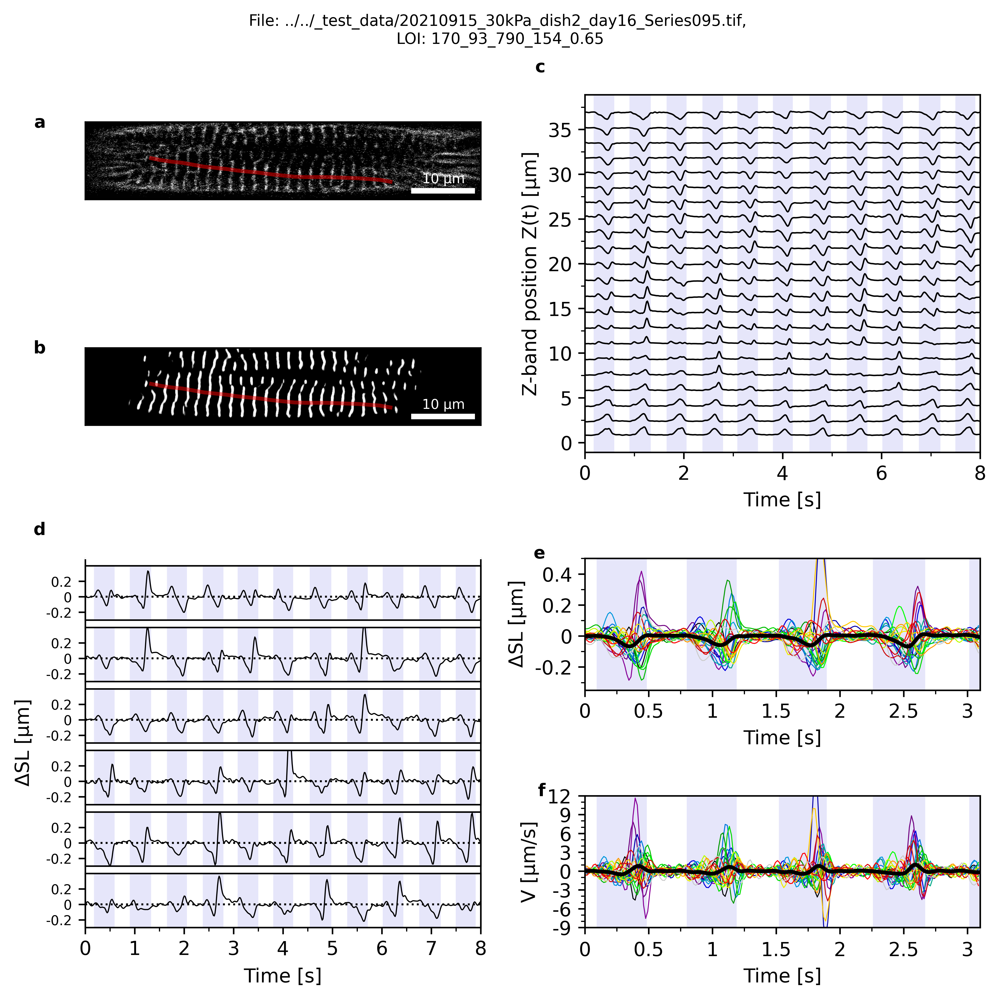

In [16]:
from sarcasm import Utils, Motion

# open LOI
filepath = '../../_test_data/20210915_30kPa_dish2_day16_Series095.tif'
lois = Utils.get_lois_of_file(filepath)
file, loi = lois[0]  # select LOI of TIF file
motion_obj = Motion(file, loi)

# create multi-panel figure 
mosaic = """
aaaccc
bbbccc
dddeee
dddfff
"""

fig, axs = plt.subplot_mosaic(mosaic, figsize=(PlotUtils.width_2cols, PlotUtils.width_2cols), constrained_layout=True, dpi=600)

# plot parameter
t_lim = (0, 8)
number_contr = 3
t_lim_overlay = (-0.1, 3)

title = f'File: {motion_obj.filename}, \nLOI: {motion_obj.loi_name}'
fig.suptitle(title, fontsize=PlotUtils.fontsize)

# image cell w/ LOI
Plots.plot_image(axs['a'], motion_obj)

# U-Net cell w/ LOI
Plots.plot_z_bands(axs['b'], motion_obj)

# kymograph and tracked z-lines
Plots.plot_z_pos(axs['c'], motion_obj, t_lim=t_lim)

# single sarcomere trajs (vel and delta slen)
Plots.plot_delta_slen(axs['d'], motion_obj, t_lim=t_lim)

# overlay delta slen
Plots.plot_overlay_delta_slen(axs['e'], motion_obj, number_contr=number_contr, t_lim=t_lim_overlay)

# overlay velocity
Plots.plot_overlay_velocity(axs['f'], motion_obj, number_contr=number_contr, t_lim=t_lim_overlay)

PlotUtils.label_all_panels(axs)

# fig.savefig('tutorial_loi.png')